##### Content under Creative Commons Attribution license CC-BY 4.0 (c)2014 Cameron Parvini.

# Particle-In-Cell Plasma Sim

Hello, and welcome back! Today we will be diving headfirst into a mind-bending application of the material covered throughout modules 1-4. Before we begin, a caveat: the simulation that we are going to create will not be a <i>fully-adaptive</i> PIC setup; for the sake of time (and not to spoil your possible thesis!) we will be making a number of simplifying assumptions. But more on all of this later, for now, let's get acquainted with the problem.

In the field of Plasma Physics, there are a number of incredibly complex phsyical interactions which, to be truthful, aren't fully explained (or, at the very least understood) by modern theories. Because of this, a number of situations arise where visualizing the reaction of particles in a plasma to various stimuli can be difficult, and at worst completely counter-intuitive! This is where the importance of simulations is revealed: in helping modern science process and interpret exactly <i>what the physics says should happen</i> . After all, how can we confirm our results if we can't compare them to anything?

A common method for simulating the motion of particles is the aptly-named "Particle in Cell" (PIC) technique, which uses a macro-particle focus on a discrete grid to calculate the problem variables. Because plasma is made up of a mixture of ions, electrons, and neutrals, it is easiest to model the reaction of each species to the specific situation being studied. In most cases, the consideration of magnetic or electric fields can complicate the calculations involved. These fields not only set the particles in motion due to their varied charge (effecting the velocities), but they also vary in strength with the location of each particle within a volume (the particles effect the fields in turn). See now why we can't just ignore the field equations? That's where all of the <b>interesting</b> physics happens! Before getting too bogged down in the minutia of the problem, the first step is to start simple.

## The Fundemental Physics

In order to calculate the motion of particles in our test volume, we need to know the equation governing their motion! This is where the all-important <i>Lorentz Force</i> comes into play:

\begin{align} \vec{\mathbf{F}} =\, q (\vec{E} + \vec{v} \times \vec{B}) \end{align}

Woah, hey, no one said anything about linear algebra coming in here! Don't let the thought of having to do it by hand intimidate you, that's just what the equations want! Ignoring the cross produt for now (we'll use some awesome scipy built-ins to take care of our linear algebra woes), we see that the electric and magnetic fields both need to be known before we try to move our particles! Well that's useful, but unless you happen to have any relationships hiding in your pocket, this is just a fancy equation that we can't use. Well, as it happens, we do have a couple more from basic physics! First, according to kinematics and Newton's Second Law:

\begin{align}
\frac{d{\vec{x}}}{d{t}} =\, \vec{v} \\
\vec{F} =\, m\vec{a}
\end{align}

We're all aware of these relations. Now, let's rearrange Newton's Second Law for acceleration, and then replace $\vec{F}$ with the force from a static electric field: 

\begin{align}
\frac{d{\vec{v}}}{d{t}} =\, \frac{q}{m}(\vec{E} + \vec{v}\times\vec{B}) \\
\end{align}

where <i>q</i> is the charge of a given particle, and <i>m</i> is the given mass of the particle adjusted for the charge (i.e. with the mass of an electron missing for the positively charged ion). Now we've got something we can use...how about a relationship to calculate $\vec{E}$? From the definition of the electric potential ($\phi$) and charge density ($\rho$):

\begin{align}
\vec{E} =\, -\nabla \phi \\
\nabla^2 \phi =\, \frac{\rho}{\epsilon _0} \\
\rho =\, e (Z_i n_i - n_e)
\end{align}

Now it looks like we have enough to start looking at how to actually <i>solve</i> a problem! In this case, <i>$Z_i$</i> is the average charge value of the ion, <i>e</i> is the charge of an electron, <i>$n_i$</i> is the number density of the ions (i.e. the number of ions per unit length), and similarly <i>$n_e$</i> is the electron number density. With all these equations in mind, it's <i>finally</i> time to start approaching the problem. 

### Problem Statement

Let's consider a group of particles consisting of half electrons, and the other half Helium ions ($He^+$). We'll say that the electrons should be given an initial velocity that is randomly generated on the order of $10^3 \frac{m}{s}$, and the larger ions are given a similarly random intial velocity of ~$10^5 \frac{m}{s}$. These particles are subjected constantly to <i>both</i> $\vec{E}$ and $\vec{B}$ fields in different directions. We wish to simulate their motion in the fields for 100 time steps. Listing the conditions for reference:

$$\text{number of particles,}\ n\ =\ 20\\
\text{number of time steps,}\ nt\ =\ 100\\
\text{initial ion velocity,}\ v_{i,ion}\ =\ 100\\
\text{initial electron velocity,}\ v_{i,e}\ =\ 100\\
\vec{B_i}\ =\ 0 \hat{i} + 0 \hat{j} + 0.1 \hat{k} \left[T\right]\\
\vec{E_i}\ =\ 1000 \hat{i} + 0 \hat{j} + 0 \hat{k} \left[\frac{V}{m}\right]$$

Right, now, how do we go about solving something like this using the PIC setup? Woah there tiger, we need to make a couple assumptions first! First, setting up a working PIC requires that we follow the four steps: intialize, loop, cleanup, and output. Let's work through the first step (which, arguably, is the bulk of the problem). Secondly, for now, we're actually going to ignore the change in $\vec{B}$ between steps because the charges we're dealing with are so small, the changes to such a large static field are essentially negligable. Not to give you a peek too far ahead, but let's import all of the libraries that we'll need for the math and animating:

In [1]:
%matplotlib inline
import numpy as np
import pylab
import random

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d.axes3d import Axes3D
from matplotlib import animation
from JSAnimation.IPython_display import display_animation

/Users/gabrielfior/anaconda/lib/python2.7/site-packages/matplotlib/font_manager.py:273: UserWarning: Matplotlib is building the font cache using fc-list. This may take a moment.
  warnings.warn('Matplotlib is building the font cache using fc-list. This may take a moment.')


In [2]:
def animateAll(frame):
        x = (loc_all[0,:n/2,frame]-L[0])
        y = (loc_all[1,:n/2,frame]-L[1])
        z = (loc_all[2,:n/2,frame]-L[2])
        ax.scatter(x,y,z,c='b',marker='o')
        x = (loc_all[0,n/2:,frame]-L[0])
        y = (loc_all[1,n/2:,frame]-L[1])
        z = (loc_all[2,n/2:,frame]-L[2])
        ax.scatter(x,y,z,c='r',marker='o')
        
def initAll():
    ax.scatter([],[],[],c='b',marker='o')
    ax.scatter([],[],[],c='r',marker='o')

All that the new animate functions do is accept a different plot type, tell the animator what to wipe the screen and replace it with each time iteration, and finally grab the proper cartesian data for each particle through time (then scatter ions and electrons separately). Don't worry about complex animation settings for now, just know that matplotlib animation can get a lot more complicated! We'll be using numpy to do most of our matrix operations and linear algebra, random for the initial velocities, then pylab, matplotlib, and the same old animation functions for setting up and rendering a 3D plot through time! Nervous? Don't be, but get ready to think in three (or more) dimensions! Let's begin by creating a custom function that will give us a grid to work with, and some useful values for later:

In [3]:
def create_grid(L,d,x_i,n,nt):
    
    """ Creates a discrete grid based on our desired length and step size,
        then also initializes our location storage matrix and calculates the number
        of grid points in the directional arrays.
    
    Parameters
    ----------
    L      : array of floats
            Desired distances from origin to the edge of the cube in each direction
    d      : float
            Discrete grid step size
    x_i    : float
            Initial position of particles in cartesian coordinates
    n      : int
            Number of particles
    nt     : int
            Number of time steps
    
    Returns
    -------
    x,y,z        : arrays of floats
                  Arrays containing all of the discrete grid locations and their
                  true cartesian value
    loc          : array of floats
                  Storage matrix for the (x,y,z) location (0th dimension) for each 
                  particle (1st dimension)
    nx,ny,nz     : ints
                  Number of grid points in each direction
    X,Y,Z        : Coordinate Matrices of floats 
                  3D matrices (size nx,ny,nz) containing all of the discrete grid 
                  points and their respective x, y, or z value. Allows for conversion
                  from index number to grid value.
    """
    
    x = np.arange(-L[0],L[0],d)
    y = np.arange(-L[1],L[1],d)
    z = np.arange(-L[2],L[2],d)
    X,Y,Z = np.meshgrid(x,y,z)
    loc = np.zeros((3,n,nt))
    loc[:,:,0] = x_i[:,:]
    nx = int(2*L[0]/d)
    ny = int(2*L[1]/d)
    nz = int(2*L[2]/d)
    
    return x, y, z, loc, nx, ny, nz, X, Y, Z

Great! Now we have plenty of tools to reference and save the locations of each particle through time. So far the only new tool we've used is np.meshgrid, which you can try out for yourself! It will return a matrix given Nd number of inputs referring to every permutation of the arrays. This is a very powerful tool, but it can be <b>very</b> computationally expensive to move into 4th, 5th, and more dimensions (not to mention mind-bending!), because you'll be exponentially increasing the overall number of permutations. Remember, your computer needs memory to run effectively...be sure to keep track of it!

Now, let's take care of that intial velocity vector! We love defining equations, don't we?

In [4]:
def initial_v(n):
    
    """ Creates randomized initial velocities for ions and electrons separately 
        based on the desired velocity ranges.
    
    Parameters
    ----------
    n      : int
            Number of particles
   
    Returns
    -------
    v_i    : Matrix of floats 
            Matrix that stores the cartesian velocity components (0th dimension) for
            each particle (1st dimension)
    """
    
    v_i = np.zeros((3,n))
    
    for i in range(0,n/2-1):
        #v_i[0,i] = random.randrange(1e5,5e5)*random.choice([-1,1]) # [m/s]
        #v_i[1,i] = random.randrange(1e5,5e5)*random.choice([-1,1]) # [m/s]
        #v_i[2,i] = random.randrange(1e5,5e5)*random.choice([-1,1]) # [m/s] 
        
        v_i[0,i] = 0.
        v_i[1,i] = 0.
        v_i[2,i] = 3.e5 # [m/s] 
    
    for i in range(n/2,n-1):#electrons
        v_i[0,i] = random.randrange(1e3,5e3)*random.choice([-1,1]) # [m/s]
        v_i[1,i] = random.randrange(1e3,5e3)*random.choice([-1,1]) # [m/s]
        #v_i[2,i] = random.randrange(1e3,5e3)*random.choice([-1,1]) # [m/s]
        v_i[2,i] = 0.
    
    return v_i

The randrange function can be especially useful, but if you're trying to create a velocity in a truly random direction, you need to include the possibility for negative values! That's where random.choice comes in, allowing us to randomly select a value from the given list.
Great! Now we've got our animations set, initial grid, and velocities! Can we go home yet? Not likely, because now we come to the meatiest functions of the day where we actually do "the stuff"!
Before we dive headfirst into writing, we should do a bit more math on our original equations (remember, about 10 cells ago?). Luckily, the Poisson's equation for $\phi$ doesn't contain a time derivative, so all we need to do is rearrange everything based on the cartesian location! But oh no...three dimensions? Come on, believe in yourself! Try to get the central difference for the second derivative, like we had to do in module 4, just in all dimensions this time!

\begin{align}
\nabla^2 \phi &= \frac{\vec{\rho}}{\epsilon _0} \\
\frac{d\phi}{dx} + \frac{d\phi}{dy} + \frac{d\phi}{dz} &= ... \\
\frac{\phi_{i-1,j,k}-2\phi_{i,j,k}+\phi_{i+1,j,k}}{\Delta x^2} + ... &= ...
\end{align}

Now that we have that discretized, let's simplify to find our desired quantity...

$$\phi_{i,j,k} = \frac{\Delta x^2 \Delta y^2 \Delta z^2}{2(\Delta y^2\Delta z^2 + \Delta x^2\Delta z^2 + \Delta x^2\Delta y^2)} * ... \\
[ \frac{\vec{\rho}}{\epsilon _0} + \frac{\phi_{i-1,j,k}+\phi_{i+1,j,k}}{\Delta x^2} + ... ]$$

While we're at it, how about discretizing equation 4 above so we can solve for the velocity at the next time step? No? Too bad!

\begin{align}
\frac{d{\vec{v}}}{d{t}} &= \frac{q}{m}(\vec{E} + \vec{v}\times\vec{B}) \\
\frac{v^{n+1} - v^{n}}{\Delta t} &= ... \\
v^{n+1} &= \frac{q \Delta t}{m}(\vec{E} + \vec{v}\times\vec{B}) + v^{n} 
\end{align}

Mathematical! Now we have enough info to put it all together. Let's start by talking a bit of logic before showing you how <i>we</i> implemented all that math. First, we'll need to be sure to bring in all the values we need to solve. This means that our function will need to take in the initial velocity for all particles, then the time step, the number of time steps, the mass of all particles, and additionally an average charge number for the ions.

It is generally good practice to leave the original matrices un-altered for debugging purposes, so making a local copy of the velocity matrix (storing all the values for time, remember, so we can animate!), the location matrix (similarly for all time), and writing the initial velocities and positions to each of them is reccommended.
Afterwards, we're going to need to store the $\vec{E}$ and $\vec{B}$ values for <i>each</i> grid point, which means separate matrices for each direction, each containing the x, y, or z component at each of those points! Now we're starting to get into some <b>huge</b> indexing, and it must be plainly stated that the solution we have found is definitely <i>not</i> the only (or even the best) way of doing things. It's just the way our minds work through the problem! With all of that being said, let's go ahead and pull back the curtain on our big function:

In [5]:
def PICsimAll(v_i,dt,nt,m,Zi):
     
    """ Takes in the intial conditions of the problem to provide the velocity and 
        location of every particle for each time step.
    
    Parameters
    ----------
    v_i    : Matrix of floats 
            Matrix that stores the cartesian initial velocity components 
            (0th dimension) for each particle (1st dimension)
    dt     : Array of float
            Time step for each particle type
    nt     : int
            Number of time steps desired
    m      : Array of float
            Mass of each particle species in the simulation
    Zi     : float
            Average charge number for the ion species
   
    Returns
    -------
    vn     : Matrix of floats 
            Matrix that stores the cartesian velocity components (0th dimension) for
            each particle (1st dimension) throughout all of time (2nd dimension)
    loca   : Matrix of floats
            Matrix that stores the cartesian location (0th dimension) for each 
            particle (1st dimension) throughout all of time (2nd dimension)
    """
    
    # Create our local holder copies
    
    vn = np.zeros((3,n,nt))
    loca = np.zeros_like(vn)
    rho = np.zeros_like(vn)         # This will use the number density to hold rho
    vn[:,:,0] = v_i[:,:]
    pot = np.zeros((nx, ny, nz))
    N = np.zeros_like(X)            # This will hold the number of particles in each index 
    pd = np.zeros_like(pot)         # Our holder matrix for recalculating phi
    Exi = np.ones_like(X)*1000      # These are the initial cartesian field holders
    Eyi = np.zeros_like(Y)
    Ezi = np.zeros_like(Z)
    Bxi = np.zeros_like(X)
    Byi = np.zeros_like(Y)
    Bzi = np.ones_like(Z)*0.1
    
    # To simplify the math we're about to do...
    den = 2*(dy**2*dz**2+dx**2*dz**2+dx**2*dy**2)
    
    for i in range(1,nt):
        
        # Get the new velocities
        vn[:,:,i] = intEOMAll(vn[:,:,i-1],m,i,dt,Exi,Eyi,Ezi,Bxi,Byi,Bzi,loca[:,:,i])
        
        # Use the old velocities to get the current location
        loca[:,:n/2-1,i] = vn[:,:n/2-1,i-1]*dt[0]
        loca[:,n/2:,i] = vn[:,n/2:,i-1]*dt[1]
        
        # Use the current locations, find their nearest index
        locInd = loca[:,:,i].astype(int)
        
        # Fancy slicing to increment by the effective charge
        N[locInd[:,:n/2-1]] += -1.
        N[locInd[:,n/2:]] += Zi*1.
        
        # Find rho!
        rho = N * e / d
        
        # Calculate the potential for all interior points given the current rho,
        # so that you can set the stage for the next time iteration
        pot[1:nx-1,1:ny-1,1:nz-1] = ( dx**2*dy**2*dz**2/(eps*den)*\
                                     (rho[1:nx-1,1:ny-1,1:nz-1]) +\
            dy**2*dz**2/(den)*(pd[2:nx,1:ny-1,1:nz-1]+pd[0:nx-2,1:ny-1,1:nz-1])+\
            dx**2*dz**2/(den)*(pd[1:nx-1,2:ny,1:nz-1]+pd[1:nx-1,0:ny-2,1:nz-1])+\
            dx**2*dy**2/(den)*(pd[1:nx-1,1:ny-1,2:nz]+pd[1:nx-1,1:ny-1,0:nz-2]) )
        
        # No boundary conditions specified, eh? Why not Neumann?
        pot[0,:,:] = pot[1,:,:]
        pot[nx-1,:,:] = pot[nx-2,:,:]
        pot[:,0,:] = pot[:,1,:]
        pot[:,ny-1,:] = pot[:,ny-2,:]
        pot[:,:,0] = pot[0,:,1]
        pot[:,:,nz-1] = pot[:,:,nz-2]
        
        # Finally, recalculate the Electric Field for the next time step
        Exi[1:nx-1,1:ny-1,1:nz-1] = -(pot[2:nx,1:ny-1,1:nz-1]-\
                                    pot[0:nx-2,1:ny-1,1:nz-1])/(2*dx)
        Eyi[1:nx-1,1:ny-1,1:nz-1] = -(pot[1:nx-1,2:ny,1:nz-1]-\
                                    pot[1:nx-1,0:ny-2,1:nz-1])/(2*dy)
        Ezi[1:nx-1,1:ny-1,1:nz-1] = -(pot[1:nx-1,1:ny-1,2:nz]-\
                                    pot[1:nx-1,1:ny-1,0:nz-2])/(2*dz)
                    
    return vn, loca

Are you dizzy yet? Well if you followed that closely, you probably saw there isn't really anything too complicated there! It's all just algebra and array slicing, and by now you're already a master. But hey, there is a function in there we haven't seen! To save us from having that function filled to the <i>brim</i> with code, we wrote a nice little subfunction to help us calculate the velocities at each time step. Take a look below:

In [6]:
def intEOMAll(v,m,t,dt,Exi,Eyi,Ezi,Bxi,Byi,Bzi,loca):
    
    """ Takes in the intial conditions of the problem to provide the velocity at the 
        next time step
    
    Parameters
    ----------
    v      : Matrix of floats 
            Matrix that stores the cartesian velocity components from the previous 
            step (0th dimension) for each particle (1st dimension)
    m      : Array of float
            Mass of each particle species in the simulation
    t      : int
            Current time step
    dt     : Array of float
            Time step for each particle type
    Exi, 
    Eyi, 
    Ezi     : 3D Matrix of floats
            Cartesian electric field components for each grid point at the current
            time step
    Bxi, 
    Byi, 
    Bzi     : 3D Matrix of floats
            Cartesian magnetic field components for each grid point at the current
            time step
    loca   : Matrix of floats
            Matrix that contains the cartesian location (0th dimension) for each 
            particle (1st dimension) at the current time step
   
    Returns
    -------
    v2     : Matrix of floats 
            Matrix that contains the cartesian velocity components (0th dimension) 
            for each particle (1st dimension) at the next time step
    """
    
    v2 = np.zeros_like(v)
    
    for i in range(0,n):
        
        # We have to grab the right m, q, and dt values for each species
        if i < n/2:
            q = -e
            mass = m[0]
            dthold = dt[0]
        else:
            q = e
            mass = m[1]
            dthold = dt[0]

        # Find the current E and B field values according to the particle's location
        # from the cartesian component matrices for each particle individually. 
        # Notice that there is no need to save these values between steps, so we
        # need only use holder arrays!
        
        Ehold = np.array([Exi[loca[0,i],loca[1,i],loca[2,i]],\
                              Eyi[loca[0,i],loca[1,i],loca[2,i]],\
                                  Ezi[loca[0,i],loca[1,i],loca[2,i]]])
        Bhold = np.array([Bxi[loca[0,i],loca[1,i],loca[2,i]],\
                              Byi[loca[0,i],loca[1,i],loca[2,i]],\
                                  Bzi[loca[0,i],loca[1,i],loca[2,i]]])
        
        # This is all to build up to the final line, equations 1 & 4 discretized 
        # and solved for the next velocity. Notice the use of our handy built-in
        # linear algebra functions from NumPy:
        v2[:,i] = (Ehold + np.cross(v[:,i],Bhold))*dthold*q/mass + v[:,i]
    
    return v2

Wow. Well, we're finally here: the utilization step! All we need to do is grab some commonly known values from the corners of the internet, feed our beastly equation, and then animate it all! Let's get this going:

In [7]:
# Initial Conditions
n = 5 # [particles]
dt_e = 2.75e-11 # [s]
dt_i = 5.0e-5 # [s]
dt = np.array([dt_e,dt_i])
nt = 100 # [steps]
m_e = 9.1094e-31 # [kg]
m_p = 1.6605e-27 # [kg]
Zi = 1.0 # [Average ion charge number, He]
m_tot = np.array([m_e,m_p])
e = 1.609e-19 # [C]
eps = 8.854e-12 # [F/m]

# Grid Info
dx = dy = dz = d = 5.0e-5 # [m]
L = 50.*np.array([d, d, d]) # [m]
x_i = np.zeros((3,n)) # [m]
x, y, z, loc, nx, ny, nz, X, Y, Z = create_grid(L,d,x_i,n,nt)

# Begin Math
v_i_tot = initial_v(n)
vt_all,loc_all = PICsimAll(v_i_tot,dt,nt,m_tot,Zi)

/Users/gabrielfior/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:57: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/gabrielfior/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:58: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future



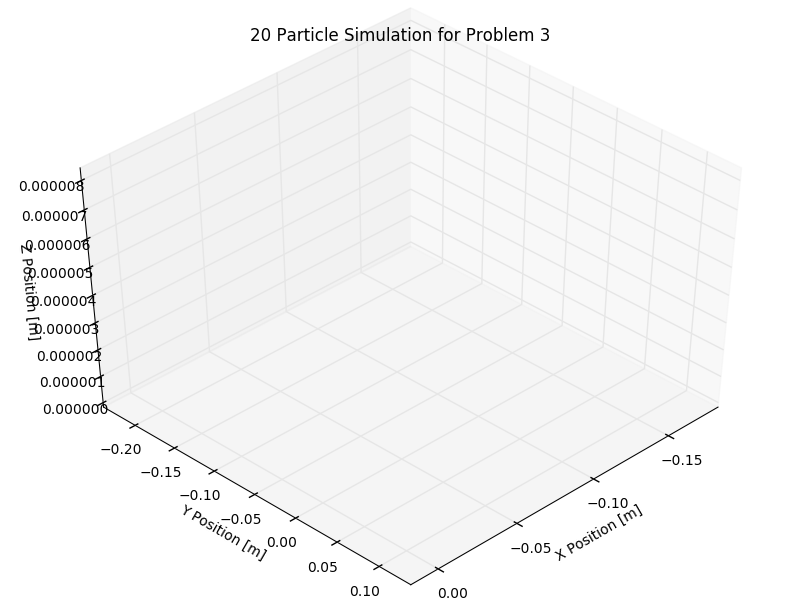
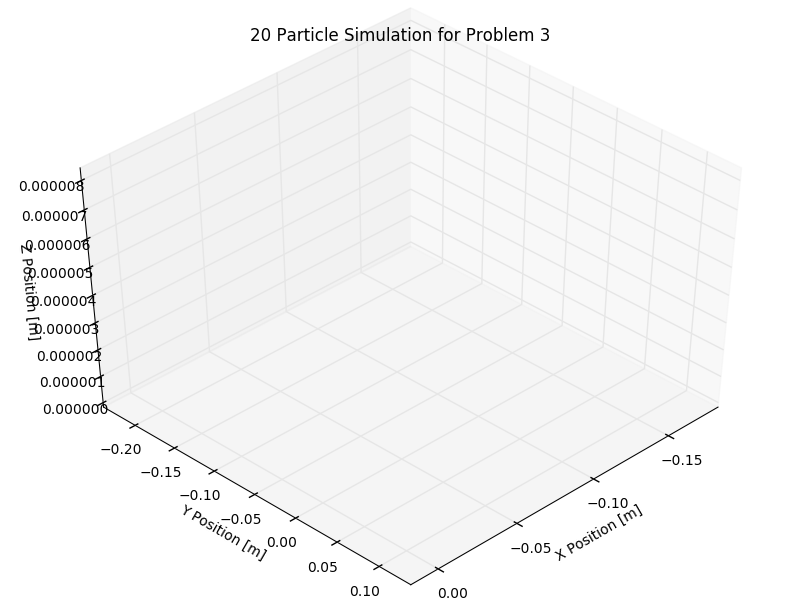
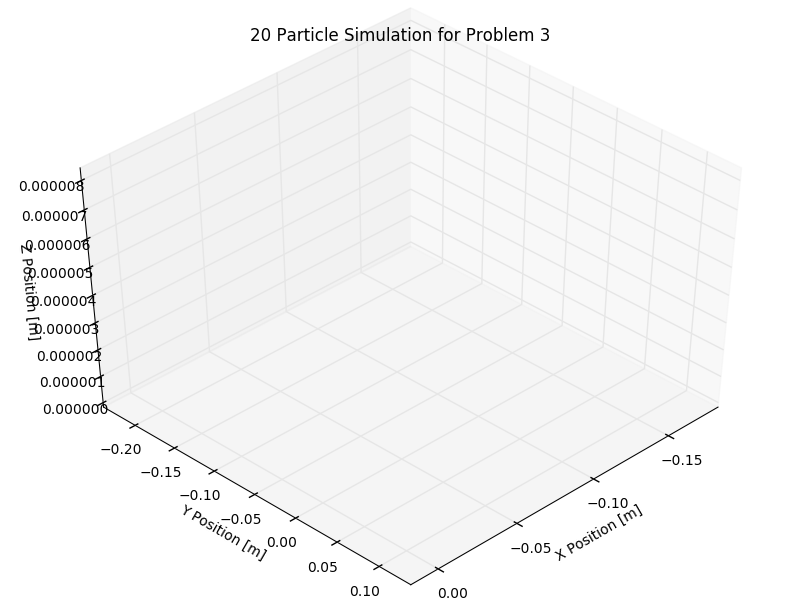
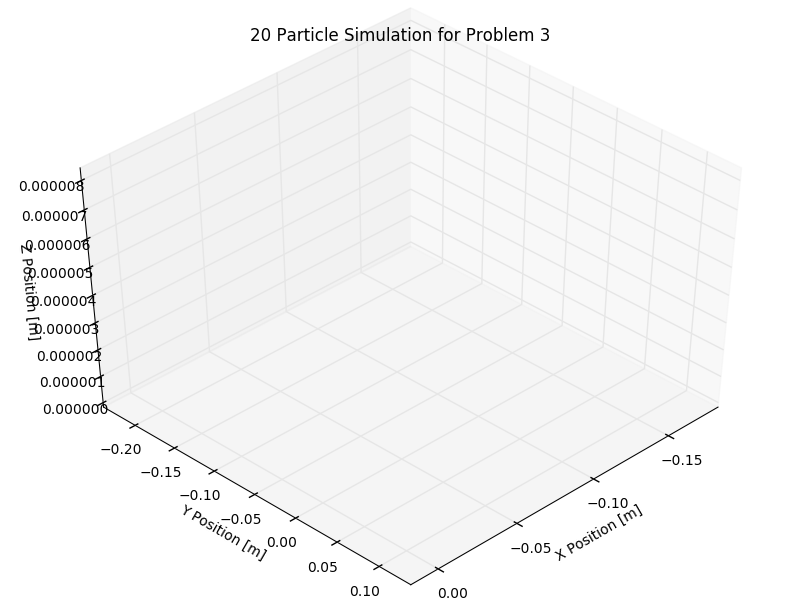
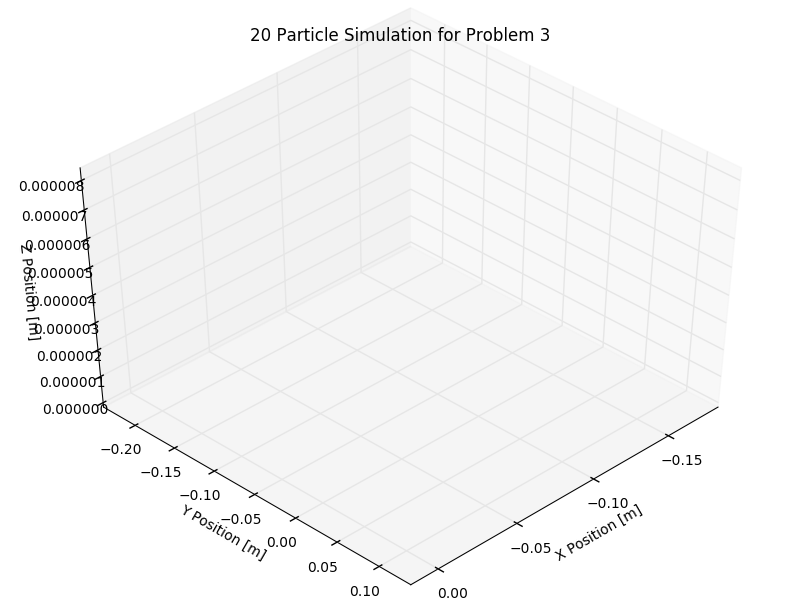
...
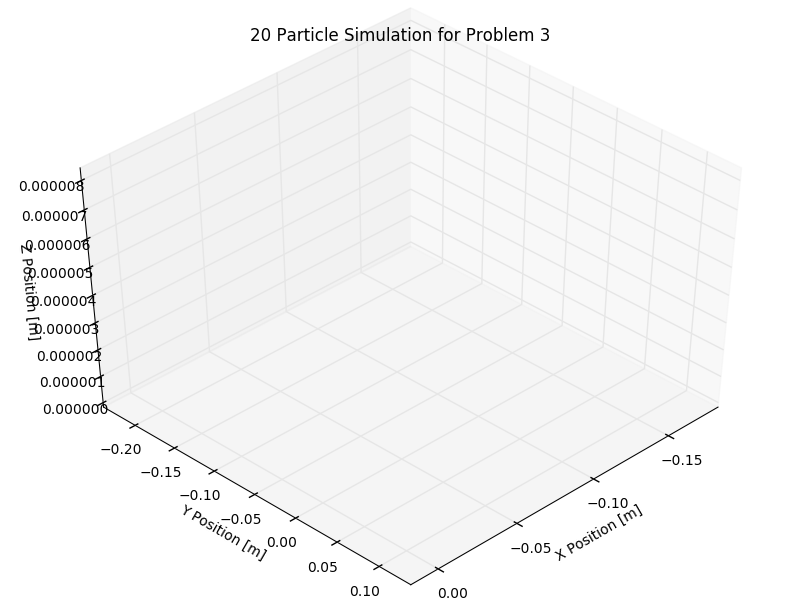
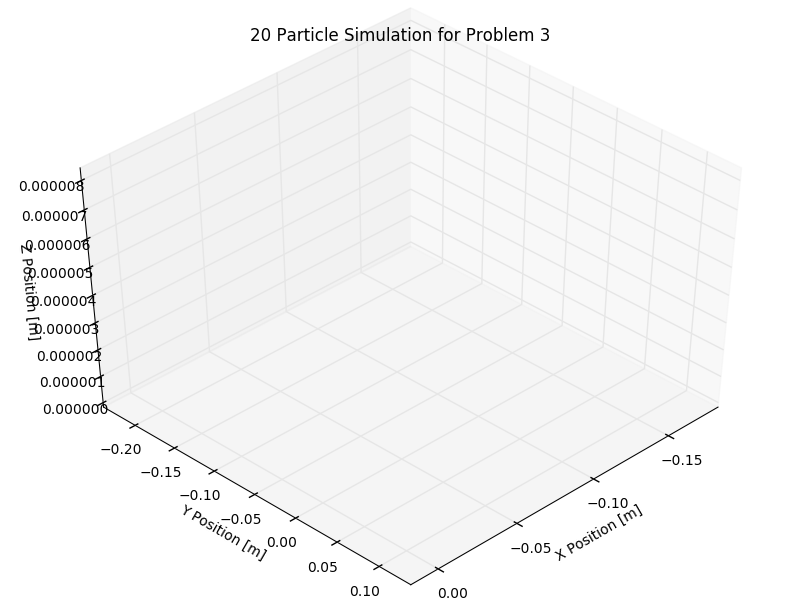
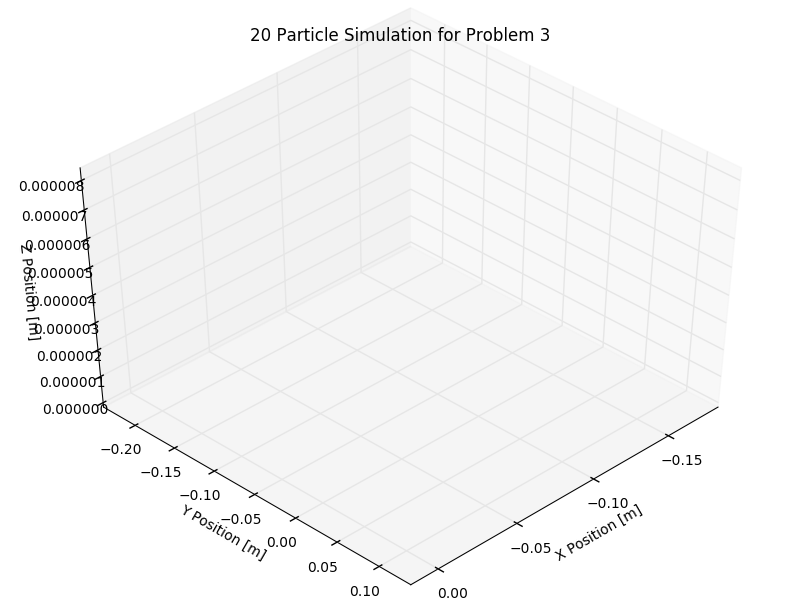
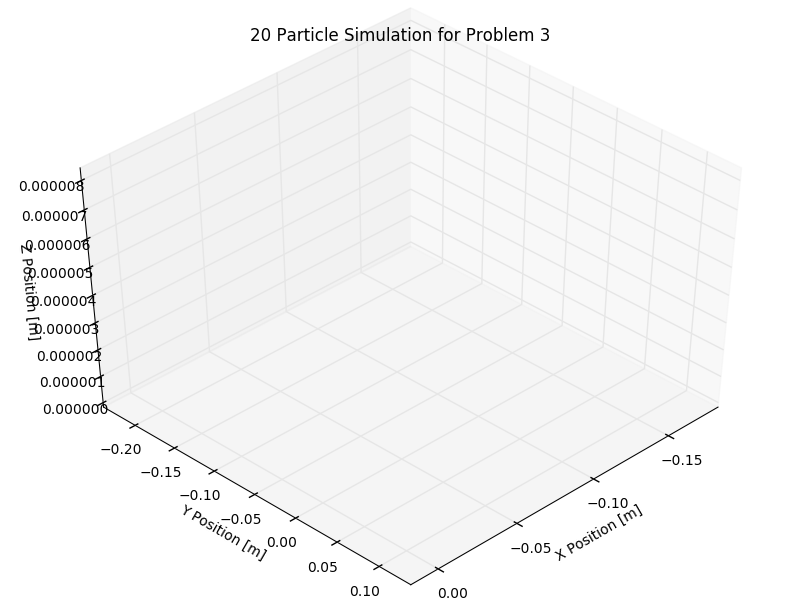
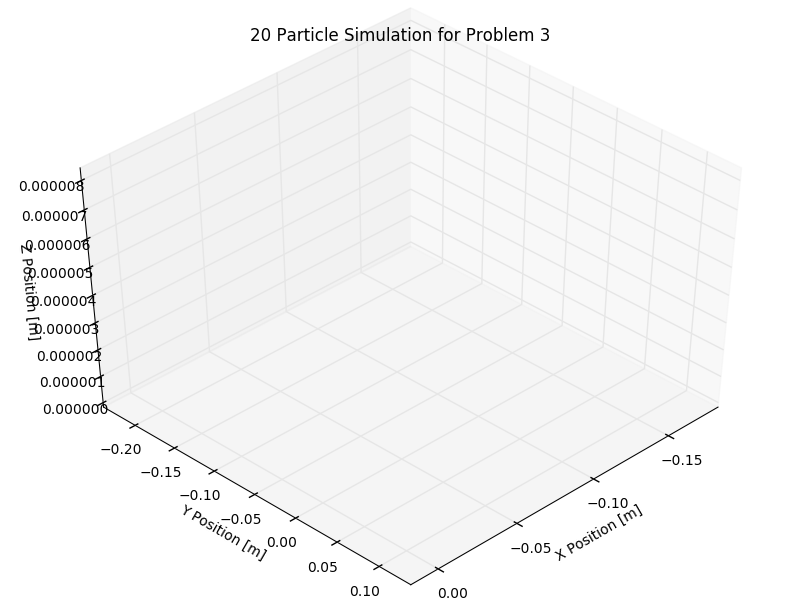

In [8]:
# Animate!
fig = pylab.figure(figsize=(8,6));
ax = Axes3D(fig)
ax.view_init(45,45)

view = loc_all
ax.set_xlim((np.ndarray.min(view[0,:,:]), np.ndarray.max(view[0,:,:])))
ax.set_ylim((np.ndarray.min(view[1,:,:]), np.ndarray.max(view[1,:,:])))
ax.set_zlim((np.ndarray.min(view[2,:,:]), np.ndarray.max(view[2,:,:])))
ax.set_xlabel(r'X Position [m]')
ax.set_ylabel(r'Y Position [m]')
ax.set_zlabel(r'Z Position [m]')
ax.set_title(r'20 Particle Simulation for Problem 3')

anim = animation.FuncAnimation(fig, animateAll, nt,\
                               init_func = initAll, interval=50)
display_animation(anim, default_mode='loop')

### Dig Deeper

Isn't it beautiful? Now not to glaze over the pretty 3D animation, but there are several unanswered points. First of all, why did we have to use two different time steps for each particle species? (HINT: look at what the red colored ions are doing in the animation...they're like a horse on the freeway!)

Second, what happens if you run the program for more time steps? Start with small increments (10? 20?) and note when you start to get errors. What is happening when you get the index referencing error from the portion of PICsimAll() that tries to write the particle location to N? Congratulations on making it to the end! Until next time...

### Citations

https://www.mpnl.seas.gwu.edu/index.php/research/modeling-and-simulation/9-particle-in-cell

Birdsall, C.K. and Langdon, A.B., Plasma Physics via computer simulation, 1985

Wikipedia contributors. "Maxwell's equations." Wikipedia, The Free Encyclopedia. Wikipedia, The Free Encyclopedia, 25 Nov. 2014. Web. 26 Nov. 2014.

In [9]:
from IPython.core.display import HTML
css_file = '../../styles/numericalmoocstyle.css'
HTML(open(css_file, "r").read())

IOError: [Errno 2] No such file or directory: '../../styles/numericalmoocstyle.css'

# Calculate beta from energy

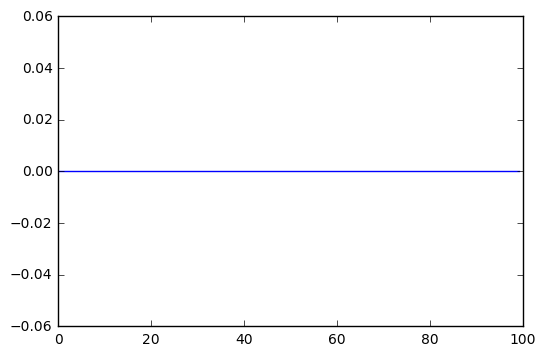

In [26]:
#vt_all,loc_all
plt.plot(vt_all[-1][4])

In [ ]:
29999917344.3/1e10